In [2]:
!unzip '/content/drive/MyDrive/New/archive (2).zip'

Streaming output truncated to the last 5000 lines.
  inflating: train_val_images/train_images/c1309467624becbc.jpg  
  inflating: train_val_images/train_images/c13105d1fd4e7af1.jpg  
  inflating: train_val_images/train_images/c1325fb75c01f67f.jpg  
  inflating: train_val_images/train_images/c134cbbeb23c9335.jpg  
  inflating: train_val_images/train_images/c1350e9e16d99a84.jpg  
  inflating: train_val_images/train_images/c1379240b5678891.jpg  
  inflating: train_val_images/train_images/c13f76726b7d57a2.jpg  
  inflating: train_val_images/train_images/c1419c127622b8ae.jpg  
  inflating: train_val_images/train_images/c155243d8248c58e.jpg  
  inflating: train_val_images/train_images/c157a397f684fe47.jpg  
  inflating: train_val_images/train_images/c15a80746217567a.jpg  
  inflating: train_val_images/train_images/c16078bf76cd6f0d.jpg  
  inflating: train_val_images/train_images/c161e6fd35f8e369.jpg  
  inflating: train_val_images/train_images/c164bd4358945dc8.jpg  
  inflating: train_val_im

#▶Imports

In [3]:
import pandas as pd
import numpy as np

from glob import glob
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

⚖outline
1. Take a look at the data
2. Extract text from images:
    -pytesseract
    -easyocr
    -keras ocr
3. Run on a few samples and compare the results

#▶Dataset imports

In [4]:
annot= pd.read_parquet('../content/annot.parquet')
img=pd.read_parquet('/content/img.parquet')
img_fns=glob('../content/train_val_images/train_images/*')

#▶Plot Example Images

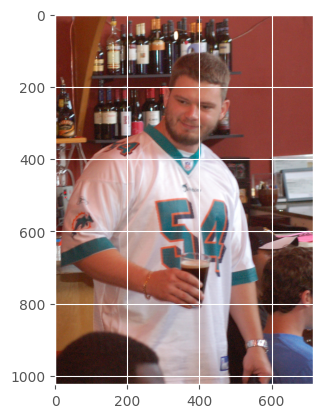

In [5]:
plt.imshow(plt.imread(img_fns[0]))

#display for first 25 images

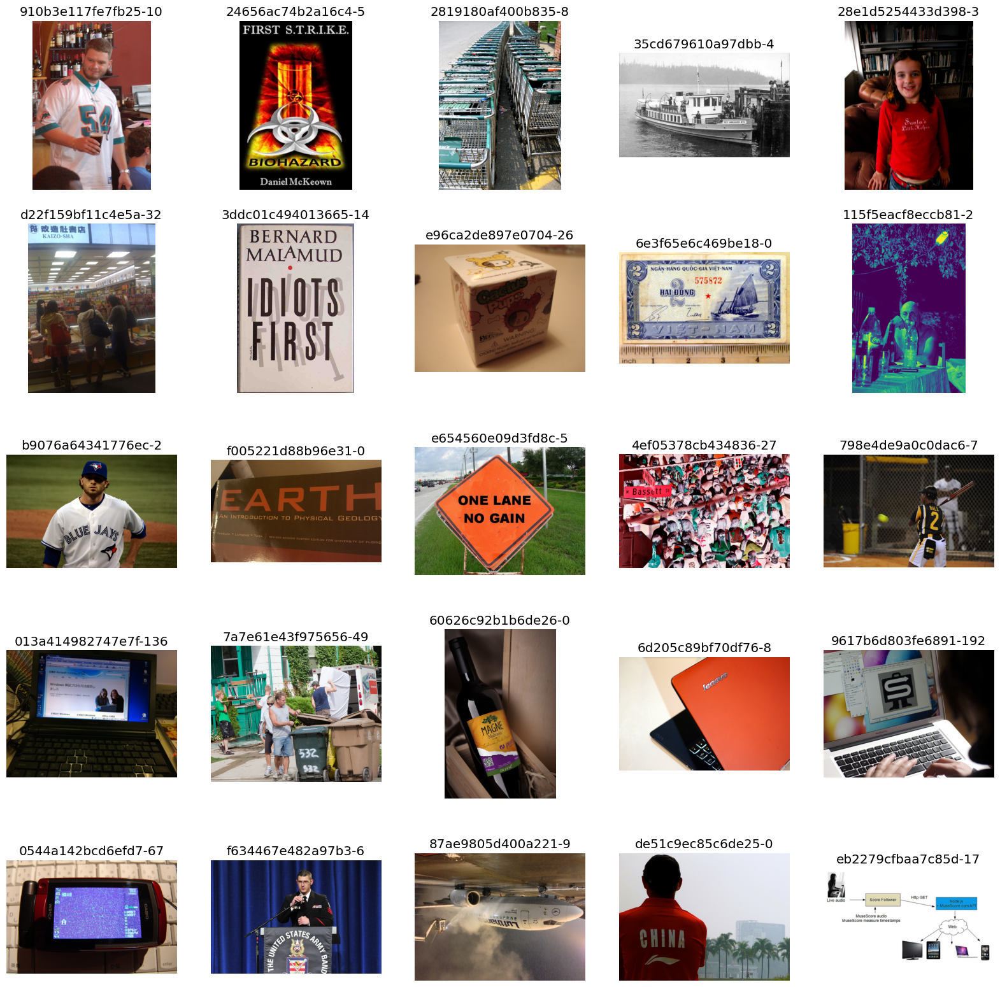

In [6]:
fig,axs=plt.subplots(5,5,figsize=(20,20))
axs=axs.flatten()
for i in range(25):
  axs[i].imshow(plt.imread(img_fns[i]))
  axs[i].axis('off')
  image_id=img_fns[i].split('/')[-1].rstrip('.jpg')
  n_annot=len(annot.query('image_id == @image_id'))
  axs[i].set_title(f'{image_id}-{n_annot}')

plt.show()

#▶Using pytesseract

works best on documents

#▶Using easyocr
uses deep learning models to run models under the hood, lil bit slower

In [7]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.6/47.6 MB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.9/813.9 kB 57.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 18.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.7.0.72
    Uninstalling opencv-python-headless-4.7.0.72:
      Successfully uninstalled opencv-python-headless-4.7.0.72


In [8]:
import easyocr

reader=easyocr.Reader(['en'],gpu=True)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [9]:
results=reader.readtext(img_fns[11])

In [10]:
print(results[0])

([[70, 121], [1024, 121], [1024, 337], [70, 337]], 'EARTH', 0.977623295457477)


#▶Using keras_ocr

In [11]:
!pip install keras-ocr -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 57.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 6.4 MB/s eta 0:00:00


In [12]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()
results=pipeline.recognize([img_fns[11]])

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5
1/1 [==============================] - 4s 4s/step


In [13]:
pd.DataFrame(results[0], columns=['text','bbox'])

,text,bbox
0,h,"[[803.66736, 159.81403], [971.1138, 137.27316]..."
1,eare,"[[66.22726, 184.89323], [837.0775, 151.55208],..."
2,an,"[[52.33963, 325.1887], [101.85472, 327.34152],..."
3,introduction,"[[118.161224, 328.58783], [403.53354, 337.0882..."
4,physical,"[[501.1345, 333.7597], [734.2711, 336.32166], ..."
5,geology,"[[766.1133, 333.72977], [1023.29846, 336.31454..."
6,to,"[[423.0, 338.0], [474.0, 338.0], [474.0, 364.0..."
7,tarbuck,"[[37.34764, 433.06012], [120.027466, 440.3554]..."
8,lutgens,"[[145.2237, 440.2787], [231.87122, 447.4004], ..."
9,tasa,"[[258.7682, 446.8939], [311.23608, 452.56607],..."


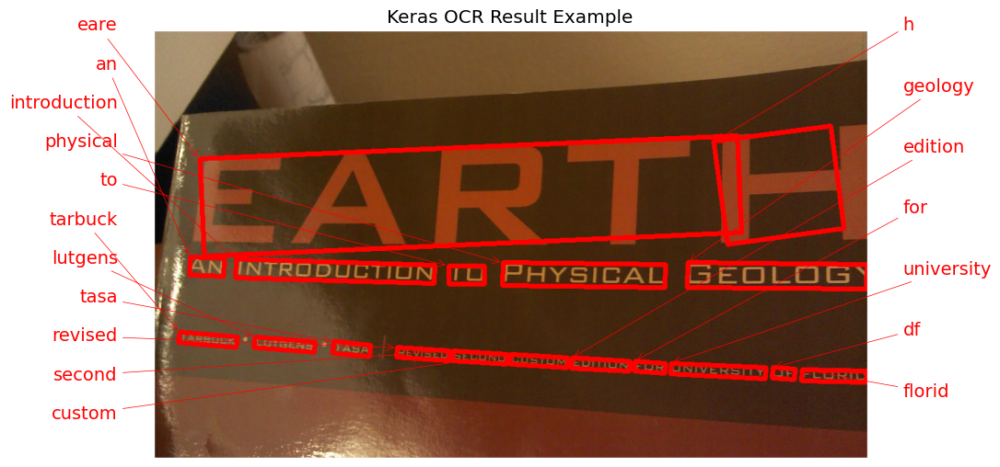

In [14]:
fig,ax=plt.subplots(figsize=(10,10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[11]),results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

#▶Compare easyocr nad kerasocr

In [24]:
#easyocr
reader = easyocr.Reader(['en'], gpu = True)

dfs = []
for img in tqdm(img_fns[:25]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

  0%|          | 0/25 [00:00<?, ?it/s]

In [18]:
easyocr_df

,bbox,text,conf,img-id
0,"[[9, 265], [141, 265], [141, 355], [9, 355]]",98H1,0.104340,5f47c5b25
0,"[[419, 391], [447, 391], [447, 405], [419, 405]]",8158,0.989829,88525c8656348be6.jpg
1,"[[591, 379], [646, 379], [646, 405], [591, 405]]",YIELD,0.874201,88525c8656348be6.jpg
2,"[[603, 401], [641, 401], [641, 421], [603, 421]]",FOR,0.995016,88525c8656348be6.jpg
3,"[[568, 422], [660, 422], [660, 446], [568, 446]]",EQUIPMENT,0.814050,88525c8656348be6.jpg
...,...,...,...,...
7,"[[85, 779], [373, 779], [373, 816], [85, 816]]",Location: Sutton South,0.959265,1e96e9a78f6
8,"[[85, 812], [423, 812], [423, 853], [85, 853]]",google com/adwords/sesny,0.997886,1e96e9a78f6
9,"[[87, 847], [451, 847], [451, 886], [87, 886]]",Visit the Google Booth; #1106,0.822668,1e96e9a78f6
10,"[[485, 878], [646, 878], [646, 944], [485, 944]]",Gocgle,0.592871,1e96e9a78f6


In [18]:
#kerasocr
pipeline = keras_ocr.pipeline.Pipeline()
dfs=[]
for img in tqdm(img_fns[:25]):
  results=pipeline.recognize([img])
  result=results[0]
  img_id=img.split('/')[-1].split('.')[0]
  img_df=pd.DataFrame(result,columns=['text','bbox'])
  img_df['img_id']=img_id
  dfs.append(img_df)
kerasocr_df=pd.concat(dfs)

Looking for /root/.keras-ocr/craft_mlt_25k.h5
Looking for /root/.keras-ocr/crnn_kurapan.h5


  0%|          | 0/25 [00:00<?, ?it/s]

1/1 [==============================] - 0s 61ms/step


#▶Plot results: easyocr vs keras_ocr

In [22]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

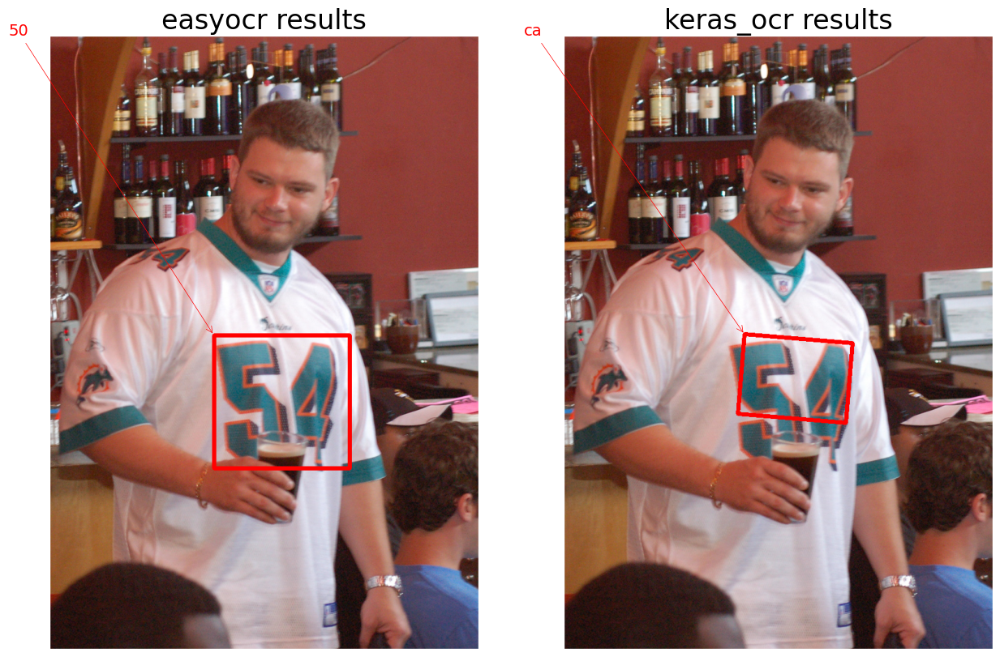

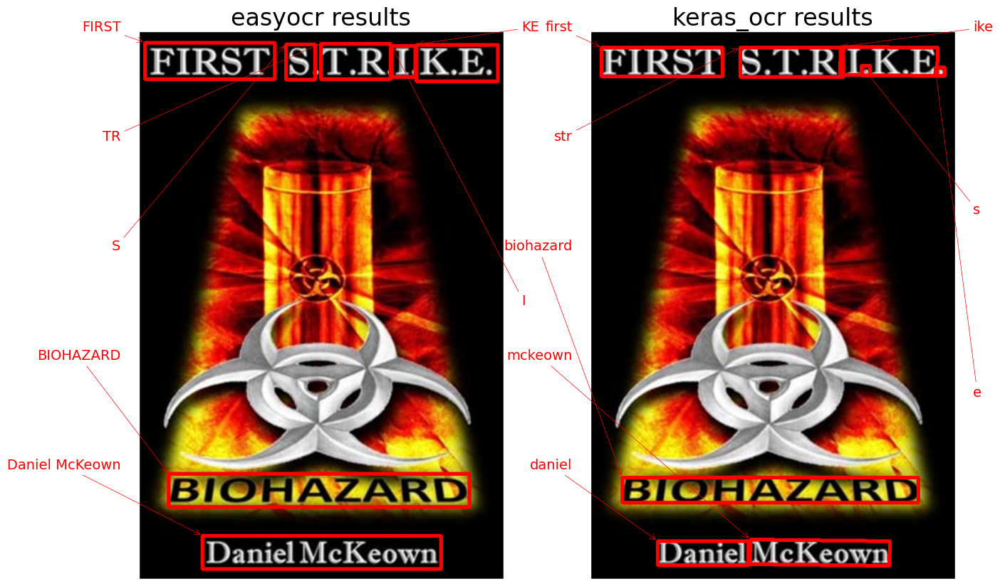

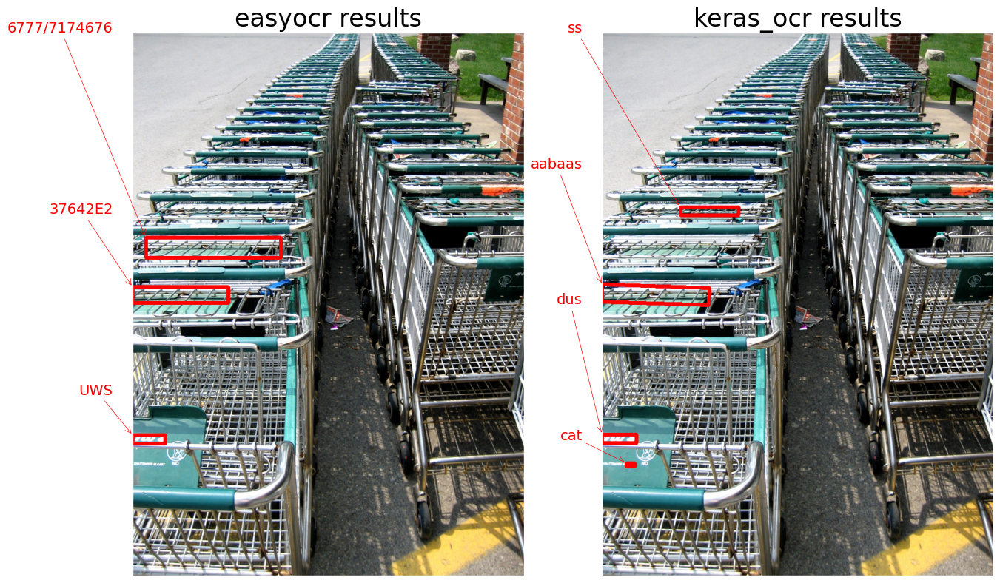

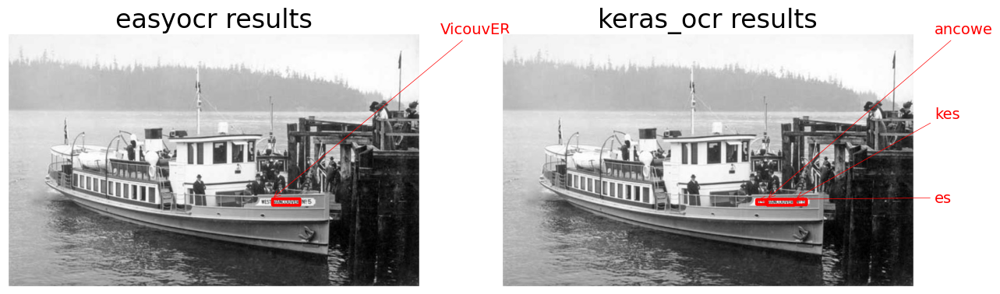

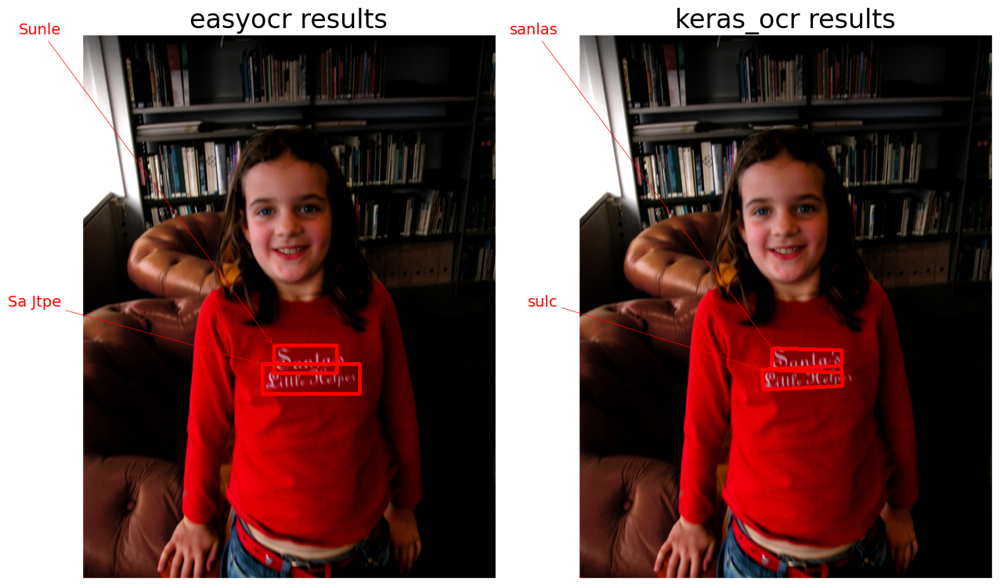

...

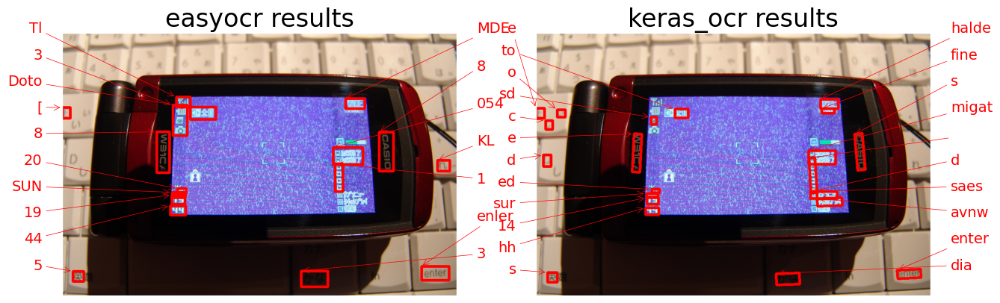

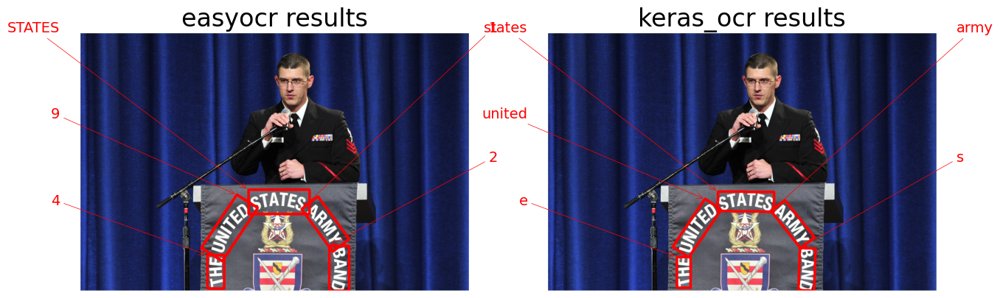

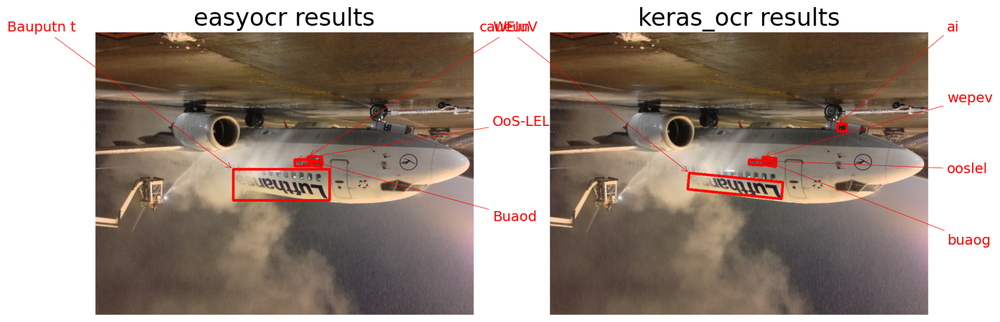

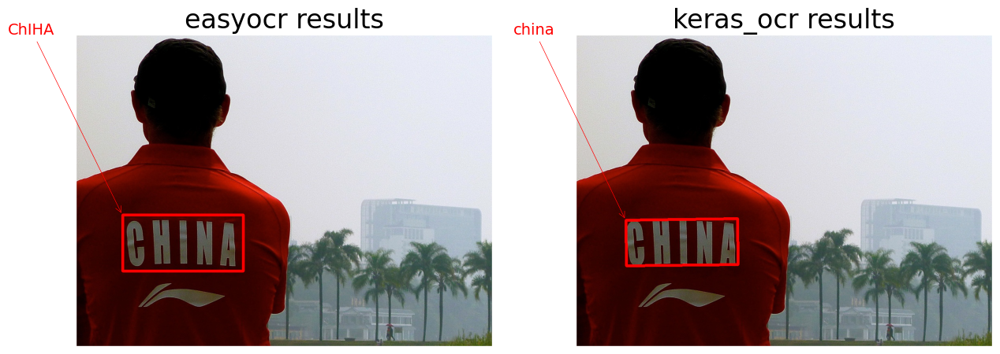

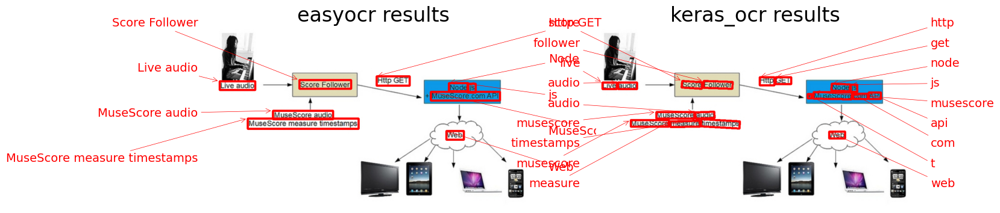

In [25]:
# Loop over results
for img_fn in img_fns[:25]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)